In [1]:
!nvidia-smi

Thu Nov  2 17:50:17 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


## Install Grounding DINO and Segment Anything Model

Our project will use two groundbreaking designs - [Grounding DINO](https://github.com/IDEA-Research/GroundingDINO) - for zero-shot detection and [Segment Anything Model (SAM)](https://github.com/facebookresearch/segment-anything) - for converting boxes into segmentations. We have to install them first.


In [3]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!git checkout -q 57535c5a79791cb76e36fdb64975271354f10251
!pip install -q -e .

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 401, done.
remote: Counting objects: 100% (164/164), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 401 (delta 128), reused 120 (delta 120), pack-reused 237
Receiving objects: 100% (401/401), 12.84 MiB | 21.01 MiB/s, done.
Resolving deltas: 100% (205/205), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 53.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 31.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 101.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 34.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 75.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 114.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 33.8 MB/s eta 0:00:00


In [4]:
%cd {HOME}

import sys
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

/content
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-ofeytj83
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-ofeytj83
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36586 sha256=76ef1e6d15dd9863eda40f5ce3bf7dcf9f7ecce182c84a16654c0e68a3c0717c
  Stored in directory: /tmp/pip-ephem-wheel-cache-6utqclh8/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything


**NOTE:** To glue all the elements of our demo together we will use the [`supervision`](https://github.com/roboflow/supervision) pip package, which will help us **process, filter and visualize our detections as well as to save our dataset**. A lower version of the `supervision` was installed with Grounding DINO. However, in this demo we need the functionality introduced in the latest versions. Therefore, we uninstall the current `supervsion` version and install version `0.6.0`.



In [5]:
!pip uninstall -y supervision
!pip install -q supervision==0.6.0

import supervision as sv
print(sv.__version__)

Found existing installation: supervision 0.4.0
Uninstalling supervision-0.4.0:
  Successfully uninstalled supervision-0.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
groundingdino 0.1.0 requires supervision==0.4.0, but you have supervision 0.6.0 which is incompatible.
0.6.0


### Download Grounding DINO Model Weights

To run Grounding DINO we need two files - configuration and model weights. The configuration file is part of the [Grounding DINO](https://github.com/IDEA-Research/GroundingDINO) repository, which we have already cloned. The weights file, on the other hand, we need to download. We write the paths to both files to the `GROUNDING_DINO_CONFIG_PATH` and `GROUNDING_DINO_CHECKPOINT_PATH` variables and verify if the paths are correct and the files exist on disk.

In [6]:
import os

GROUNDING_DINO_CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(GROUNDING_DINO_CONFIG_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CONFIG_PATH))

/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


In [7]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [8]:
import os

GROUNDING_DINO_CHECKPOINT_PATH = os.path.join(HOME, "weights", "groundingdino_swint_ogc.pth")
print(GROUNDING_DINO_CHECKPOINT_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CHECKPOINT_PATH))

/content/weights/groundingdino_swint_ogc.pth ; exist: True


### Download Segment Anything Model (SAM) Weights

As with Grounding DINO, in order to run SAM we need a weights file, which we must first download. We write the path to local weight file to `SAM_CHECKPOINT_PATH` variable and verify if the path is correct and the file exist on disk.

In [9]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights

!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

/content
/content/weights


In [10]:
import os

SAM_CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(SAM_CHECKPOINT_PATH, "; exist:", os.path.isfile(SAM_CHECKPOINT_PATH))

/content/weights/sam_vit_h_4b8939.pth ; exist: True


## Load models

In [11]:
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Load Grounding DINO Model

In [12]:
%cd {HOME}/GroundingDINO

from groundingdino.util.inference import Model

grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

/content/GroundingDINO


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


### Load Segment Anything Model (SAM)

In [13]:
SAM_ENCODER_VERSION = "vit_h"

In [14]:
from segment_anything import sam_model_registry, SamPredictor

sam = sam_model_registry[SAM_ENCODER_VERSION](checkpoint=SAM_CHECKPOINT_PATH).to(device=DEVICE)
sam_predictor = SamPredictor(sam)

## Download Example Data

Let's download few example images. Feel free to replace my images with yours. All you have to do is upload them to the `{HOME}/data` directory. If you're looking for data, take a peek at [Roboflow Universe](https://universe.roboflow.com/)! You're sure to find something interesting.

In [15]:
f"{HOME}/data"

'/content/data'

In [16]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-5.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-6.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-7.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-8.jpeg

/content
/content/data


## Single Image Mask Auto Annotation

Before we automatically annotate the entire dataset let's focus for a moment on a single image.

In [17]:
SOURCE_IMAGE_PATH = f"{HOME}/data/dog-3.jpeg"
CLASSES = ['car', 'dog', 'person', 'nose', 'chair', 'shoe', 'ear']
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

### Zero-Shot Object Detection with Grounding DINO

**NOTE:** To get better Grounding DINO detection we will leverage a bit of prompt engineering using `enhance_class_name` function defined below. 👇 You can learn more from our [Grounding DINO tutorial](https://blog.roboflow.com/grounding-dino-zero-shot-object-detection/).

In [18]:
from typing import List

def enhance_class_name(class_names: List[str]) -> List[str]:
    return [
        f"all {class_name}s"
        for class_name
        in class_names
    ]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


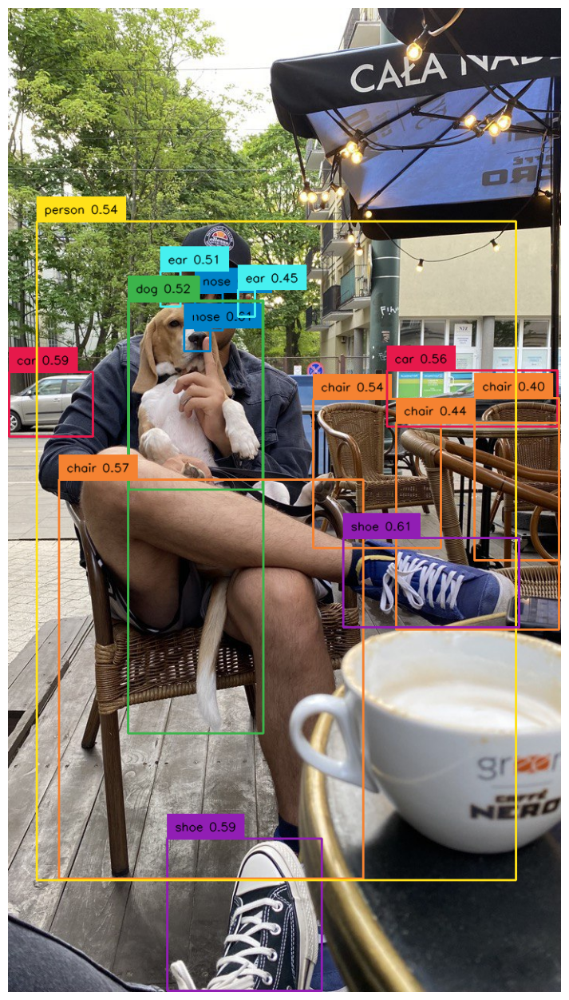

In [19]:
import cv2
import supervision as sv

# load image
image = cv2.imread(SOURCE_IMAGE_PATH)

# detect objects
detections = grounding_dino_model.predict_with_classes(
    image=image,
    classes=enhance_class_name(class_names=CLASSES),
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

# annotate image with detections
box_annotator = sv.BoxAnnotator()
labels = [
    f"{CLASSES[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _
    in detections]
annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

### Prompting SAM with detected boxes

In [20]:
import numpy as np
from segment_anything import SamPredictor


def segment(sam_predictor: SamPredictor, image: np.ndarray, xyxy: np.ndarray) -> np.ndarray:
    sam_predictor.set_image(image)
    result_masks = []
    for box in xyxy:
        masks, scores, logits = sam_predictor.predict(
            box=box,
            multimask_output=True
        )
        index = np.argmax(scores)
        result_masks.append(masks[index])
    return np.array(result_masks)

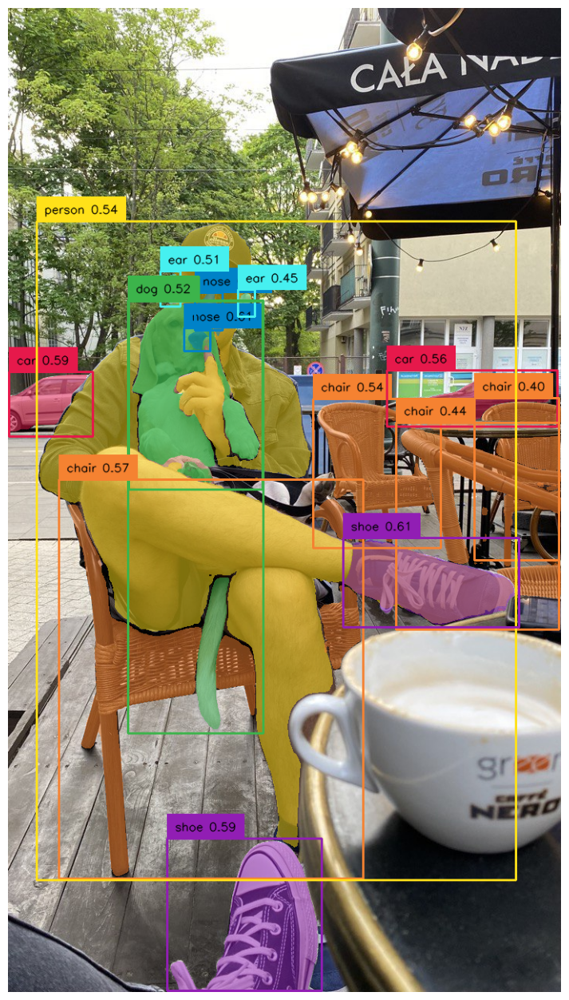

In [21]:
import cv2

# convert detections to masks
detections.mask = segment(
    sam_predictor=sam_predictor,
    image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
    xyxy=detections.xyxy
)

# annotate image with detections
box_annotator = sv.BoxAnnotator()
mask_annotator = sv.MaskAnnotator()
labels = [
    f"{CLASSES[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _
    in detections]
annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_image, (16, 16))

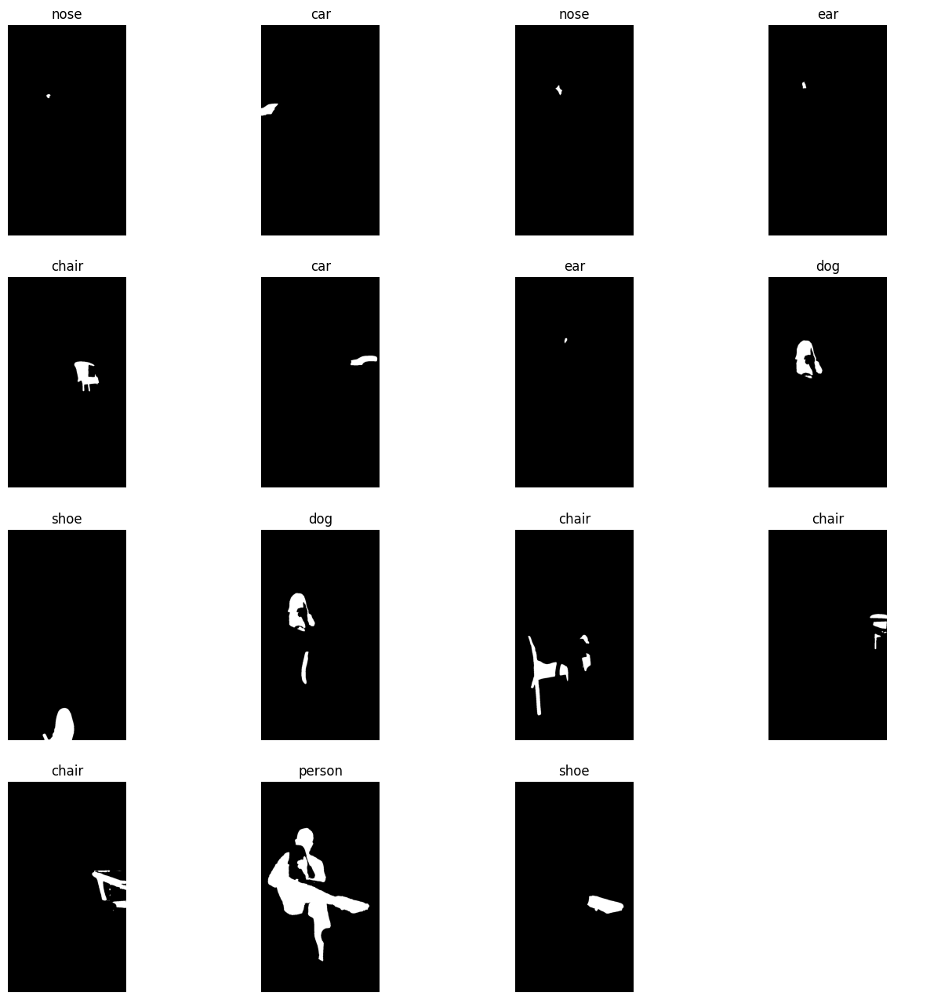

In [22]:
import math

grid_size_dimension = math.ceil(math.sqrt(len(detections.mask)))

titles = [
    CLASSES[class_id]
    for class_id
    in detections.class_id
]

sv.plot_images_grid(
    images=detections.mask,
    titles=titles,
    grid_size=(grid_size_dimension, grid_size_dimension),
    size=(16, 16)
)

## Full Dataset Mask Auto Annotation

In [23]:
import os

IMAGES_DIRECTORY = os.path.join(HOME, 'data')
IMAGES_EXTENSIONS = ['jpg', 'jpeg', 'png']

CLASSES = ['car', 'dog', 'person', 'nose', 'chair', 'shoe', 'ear', 'coffee', 'backpack', 'cap']
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

### Extract labels from images

In [24]:
import cv2
from tqdm.notebook import tqdm

images = {}
annotations = {}

image_paths = sv.list_files_with_extensions(
    directory=IMAGES_DIRECTORY,
    extensions=IMAGES_EXTENSIONS)

for image_path in tqdm(image_paths):
    image_name = image_path.name
    image_path = str(image_path)
    image = cv2.imread(image_path)

    detections = grounding_dino_model.predict_with_classes(
        image=image,
        classes=enhance_class_name(class_names=CLASSES),
        box_threshold=BOX_TRESHOLD,
        text_threshold=TEXT_TRESHOLD
    )
    detections = detections[detections.class_id != None]
    detections.mask = segment(
        sam_predictor=sam_predictor,
        image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
        xyxy=detections.xyxy
    )
    images[image_name] = image
    annotations[image_name] = detections

  0%|          | 0/8 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


**NOTE:** Before we save our `Detections` in Pascal VOC XML format, let's take a peek at the annotations we obtained. This step is optional, feel free to skip it.

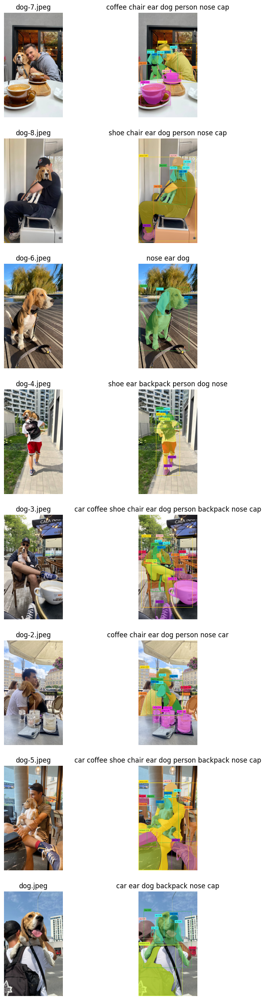

In [25]:
plot_images = []
plot_titles = []

box_annotator = sv.BoxAnnotator()
mask_annotator = sv.MaskAnnotator()

for image_name, detections in annotations.items():
    image = images[image_name]
    plot_images.append(image)
    plot_titles.append(image_name)

    labels = [
        f"{CLASSES[class_id]} {confidence:0.2f}"
        for _, _, confidence, class_id, _
        in detections]
    annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
    annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)
    plot_images.append(annotated_image)
    title = " ".join(set([
        CLASSES[class_id]
        for class_id
        in detections.class_id
    ]))
    plot_titles.append(title)

sv.plot_images_grid(
    images=plot_images,
    titles=plot_titles,
    grid_size=(len(annotations), 2),
    size=(2 * 4, len(annotations) * 4)
)

# Download and Setup Testing Dataset

In [26]:
import os
import pandas as pd
import random
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [27]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [28]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [29]:
%%capture
!unzip "/content/gdrive/MyDrive/test-archive.zip" -d "/content/testing-dataset"

In [30]:
!mv "/content/testing-dataset/development_test_data/gallery" "/content/"
!mv "/content/testing-dataset/development_test_data/queries" "/content/"

In [31]:
!mkdir "/content/original_datasets"
!mv "/content/testing-dataset/development_test_data/gallery.csv" "/content/original_datasets/"
!mv "/content/testing-dataset/development_test_data/queries.csv" "/content/original_datasets/"

In [32]:
!rm -rf "/content/testing-dataset"

In [33]:
gallery = pd.read_csv("/content/original_datasets/gallery.csv")
gallery.head()

,seller_img_id,img_path,product_id
0,0,gallery/ambitious-tough-teal-from-asgard.jpg,5019
1,1,gallery/fine-shrewd-oarfish-of-genius.jpg,5008
2,2,gallery/bold-nickel-gecko-of-reputation.jpg,9
3,3,gallery/marvellous-uber-boobook-of-lightning.jpg,3589
4,4,gallery/bouncy-economic-agama-of-honeydew.jpg,3656


In [34]:
query = pd.read_csv("/content/original_datasets/queries.csv")
query.head()

,user_img_id,img_path,bbox_x,bbox_y,bbox_w,bbox_h,product_id
0,0,queries/magnetic-powerful-platypus-of-hail.jpeg,0,212,740,664,5013
1,1,queries/free-keen-mole-of-cookies.jpeg,0,43,714,378,3550
2,2,queries/hilarious-precious-parakeet-of-adverti...,240,310,395,405,71
3,3,queries/optimal-uptight-ringtail-of-cleaning.jpeg,0,242,475,627,3566
4,4,queries/nonchalant-impala-of-fabulous-artistry...,350,125,150,81,5329


In [35]:
def get_images_of_a_product_id(product_ids):
  selection = random.sample(product_ids, 1)
  product_ids.remove(selection[0])
  return selection[0]

In [36]:
def get_img_color_convert(img_path):
  """
  This function returns an image in the format RGB when the path
  to the image is given

  Parameters
  ----------
  img_path: string
      The path to the image

  Returns
  -------
  RGB image of the image in the specified path
  """
  return cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

def get_img(img_path):
  """
  This function returns an image in the format RGB when the path
  to the image is given

  Parameters
  ----------
  img_path: string
      The path to the image

  Returns
  -------
  RGB image of the image in the specified path
  """
  return cv2.imread(img_path)

def draw_bounding_box_and_save(img_path, x, y, w, h):
  """
  This function draw a bounding box specified by x, y, w, h parameters
  and save the image in the '/content/temp-imgs/' folder

  Parameters
  ----------
  img_path: string
      The path to original image which the bounding box should be drawn
  x: integer
      x-coordinate of top-left corner of bounding box
  y: integer
      y-coordinate of top-left corner of bounding box
  w: integer
      width of bounding box in pixels
  h: integer
      height of bounding box in pixels
  """
  image = get_img(img_path)
  image = image[y:y+h, x:x+w]
  # cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,255), 4)

  Path("/content/temp-imgs").mkdir(parents=True, exist_ok=True)

  filepath = '/content/temp-imgs/' + img_path.split('/')[-1]
  cv2.imwrite(filepath, image)
  return filepath

def get_query_and_gallery_images_for_a_product_id(product_id):
  """
  This function returns a list of gallery image paths and a list of query
  image paths correcponding to a specific product_id in testing dataset

  Parameters
  ----------
  product_id: integer

  Returns
  -------
  Two list of file paths of gallery and query images corresponding to product_id
  """
  query_images_for_product_id = query.loc[query['product_id'] == product_id]
  query_image_list = []
  for index, row in query_images_for_product_id.iterrows():
    img_path = row['img_path']
    x = row['bbox_x']
    y = row['bbox_y']
    w = row['bbox_w']
    h = row['bbox_h']
    query_image_list.append(draw_bounding_box_and_save('/content/' + img_path, x, y, w, h))

  gallery_images_for_product_id = gallery.loc[gallery['product_id'] == product_id]
  gallery_image_list = gallery_images_for_product_id['img_path'].tolist()

  return query_image_list, gallery_image_list

def show_query_image_and_gpt_gallery_images(product_id):
  query_imgs, gallery_imgs = get_query_and_gallery_images_for_a_product_id(product_id)
  num_cols = max(len(query_imgs), len(gallery_imgs))
  fig, axis = plt.subplots(2, num_cols, figsize = (10, 6))

  index = 0
  while index < num_cols:
    if len(query_imgs) > index:
      if num_cols > 1:
        axis[0, index].imshow(get_img_color_convert(query_imgs[index]))
        axis[0, index].axis("off")
      else:
        axis[0].imshow(get_img_color_convert(query_imgs[index]))
        axis[0].axis("off")
    else:
      axis[0, index].axis("off")
    index = index + 1

  index = 0
  while index < num_cols:
    if len(gallery_imgs) > index:
      if num_cols > 1:
        axis[1, index].imshow(get_img_color_convert('/content/' + gallery_imgs[index]))
        axis[1, index].axis("off")
      else:
        axis[1].imshow(get_img_color_convert('/content/' + gallery_imgs[index]))
        axis[1].axis("off")
    else:
      axis[1, index].axis("off")
    index = index + 1

  fig.suptitle('product_id=' + str(product_id))
  if num_cols > 1:
    axis[0, 0].set_title('Query Images')
    axis[1, 0].set_title('Gallery Images')
  else:
    axis[0].set_title('Query Images')
    axis[1].set_title('Gallery Images')

  plt.show()

In [37]:
product_ids = gallery['product_id'].unique().tolist()
print(len(product_ids))

609


In [38]:
!rm -rf '/content/temp-imgs'

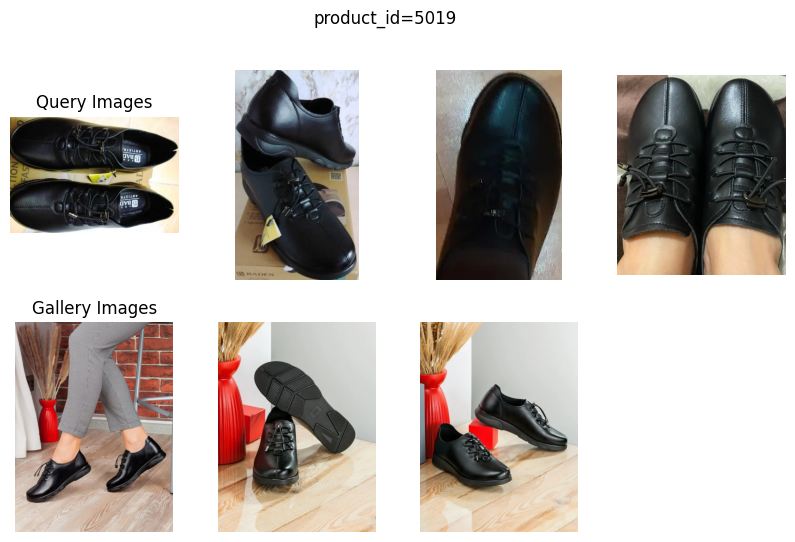

In [39]:
product_id_for_iteration = get_images_of_a_product_id(product_ids)
product_id_for_iteration = 5019
show_query_image_and_gpt_gallery_images(product_id_for_iteration)

## Product Detection and Segmentation

In [40]:
CLASSES = ['products']
BOX_TRESHOLD = 0.4
TEXT_TRESHOLD = 0.25

In [41]:
query_imgs, gallery_imgs = get_query_and_gallery_images_for_a_product_id(product_id_for_iteration)

for i in range(len(gallery_imgs)):
  gallery_imgs[i] = '/content/' + gallery_imgs[i]

images = {}
annotations = {}
image_paths_dict = {}

image_paths = query_imgs + gallery_imgs

for image_path in tqdm(image_paths):
    image_name = image_path.split('/')[-1]
    image = cv2.imread(image_path)

    detections = grounding_dino_model.predict_with_classes(
        image=image,
        classes=enhance_class_name(class_names=CLASSES),
        box_threshold=BOX_TRESHOLD,
        text_threshold=TEXT_TRESHOLD
    )
    detections = detections[detections.class_id != None]
    detections.mask = segment(
        sam_predictor=sam_predictor,
        image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
        xyxy=detections.xyxy
    )
    images[image_name] = image
    image_paths_dict[image_name] = image_path
    annotations[image_name] = detections

  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


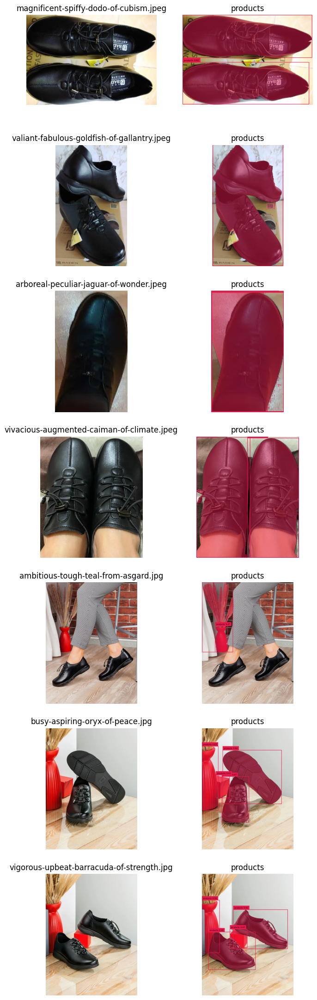

In [42]:
plot_images = []
plot_titles = []

box_annotator = sv.BoxAnnotator()
mask_annotator = sv.MaskAnnotator()

for image_name, detections in annotations.items():
    image = images[image_name]
    plot_images.append(image)
    plot_titles.append(image_name)

    labels = [
        f"{CLASSES[class_id]} {confidence:0.2f}"
        for _, _, confidence, class_id, _
        in detections]
    annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
    annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)
    plot_images.append(annotated_image)
    title = " ".join(set([
        CLASSES[class_id]
        for class_id
        in detections.class_id
    ]))
    plot_titles.append(title)

sv.plot_images_grid(
    images=plot_images,
    titles=plot_titles,
    grid_size=(len(annotations), 2),
    size=(2 * 4, len(annotations) * 4)
)

In [43]:
m = (detections.mask)[:1, :]
m = m.astype(int)
m = np.repeat(m, 3, axis = 0)
m = np.where(m==0, 0, 1)
print(m.shape)
m = m.astype('uint8')
print(m.dtype)

(3, 1000, 750)
uint8


In [44]:
from torchvision.io import read_image
image = read_image(image_paths[-1])
print(image.shape)
print(image.dtype)
image = image.numpy()
print(image.shape)
print(image.dtype)

torch.Size([3, 1000, 750])
torch.uint8
(3, 1000, 750)
uint8


In [45]:
masked = np.multiply(image, m)

(3, 1000, 750)


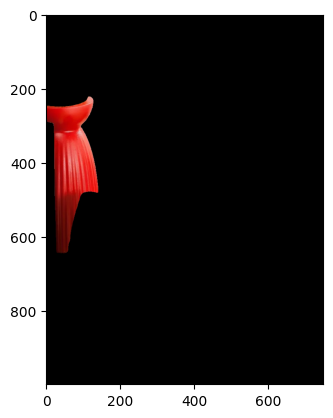

In [46]:
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
print(masked.shape)
masked_ = torch.tensor(masked)
masked_ = F.to_pil_image(masked_)
plt.imshow(masked_)

## Masking the Images

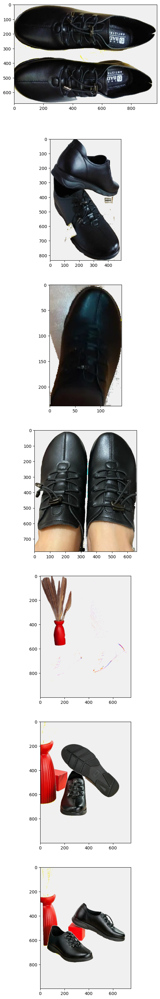

In [47]:
num_sub_plots = len(annotations)
f = plt.figure()
f.set_figwidth(6)
f.set_figheight(num_sub_plots * 6)
idx = 1
for image_name, detections in annotations.items():
  masks = detections.mask
  if len(masks) >= 1:
    masks_np_arr = {}

    for i in range(len(masks)):
      mask = masks[i:i+1, :]
      mask = mask.astype(int)
      mask = np.repeat(mask, 3, axis = 0)
      mask = np.where(mask==0, 0, 1)
      # mask = mask.astype('uint8')
      masks_np_arr[i] = mask

    final_mask = None
    multi_masks = False
    if len(masks_np_arr) > 1:
      multi_masks = True
      for key, mask in masks_np_arr.items():
        if final_mask is None:
          final_mask = mask
        else:
          final_mask = np.add(final_mask, mask)
      final_mask = np.where(final_mask > 0, 1, 0)
      # final_mask = final_mask.astype('uint8')
    else:
      final_mask = masks_np_arr[0]

    img_path = image_paths_dict[image_name]
    image = read_image(img_path)
    image = image.numpy()

    # final_mask = final_mask.astype('int64')
    final_mask = np.where(final_mask == 0, -1, 1)
    masked = np.multiply(image, final_mask)
    masked = np.where(masked < 0, 240, masked)
    masked = masked.astype('uint8')

    masked_ = torch.tensor(masked)
    masked_ = F.to_pil_image(masked_)
    plt.subplot(num_sub_plots, 1, idx), plt.imshow(masked_)
    idx += 1

## Masking the Images Using the Inverse of the Mask

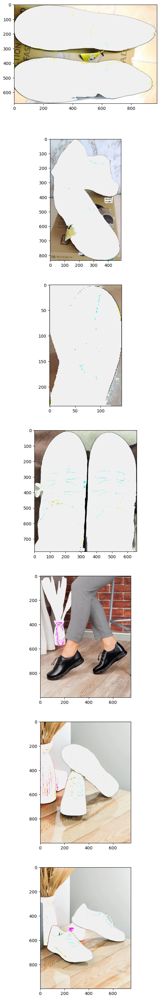

In [48]:
num_sub_plots = len(annotations)
f = plt.figure()
f.set_figwidth(6)
f.set_figheight(num_sub_plots * 6)
idx = 1
for image_name, detections in annotations.items():
  masks = detections.mask
  if len(masks) >= 1:
    masks_np_arr = {}
    for i in range(len(masks)):
      mask = masks[i:i+1, :]
      mask = mask.astype(int)
      mask = np.repeat(mask, 3, axis = 0)
      mask = np.where(mask==0, 0, 1)
      #mask = mask.astype('uint8')
      masks_np_arr[i] = mask

    final_mask = None
    multi_masks = False
    if len(masks_np_arr) > 1:
      multi_masks = True
      for key, mask in masks_np_arr.items():
        if final_mask is None:
          final_mask = mask
        else:
          final_mask = np.add(final_mask, mask)
      final_mask = np.where(final_mask > 0, 1, 0)
      final_mask = np.where(final_mask==0, 1, 0)
      # final_mask = final_mask.astype('uint8')
    else:
      final_mask = masks_np_arr[0]
      final_mask = np.where(final_mask==0, 1, 0)
      # final_mask = final_mask.astype('uint8')

    img_path = image_paths_dict[image_name]
    image = read_image(img_path)
    image = image.numpy()

    # final_mask = final_mask.astype('int64')
    final_mask = np.where(final_mask == 0, -1, 1)
    masked = np.multiply(image, final_mask)
    masked = np.where(masked < 0, 240, masked)
    masked = masked.astype('uint8')

    masked_ = torch.tensor(masked)
    masked_ = F.to_pil_image(masked_)
    plt.subplot(num_sub_plots, 1, idx), plt.imshow(masked_)
    idx += 1

# Generate Masks and Inverse Masks for All Gallery Images

In [49]:
%%capture
!pip install open_clip_torch

In [50]:
import os
import open_clip
import torch
from tqdm import tqdm
from torch.utils.data import DataLoader
import torchvision.transforms as T
from torchvision.io import read_image
from torch.utils.data import Dataset
import pandas as pd
import torchvision.transforms as T
import torchvision.transforms.functional as F
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import math

import warnings
warnings.filterwarnings("ignore")

## Download and Load the Previously Trained ViT-H Model

In [51]:
!mkdir '/content/pretrained'
!cp '/content/gdrive/MyDrive/visual-product-recognition-pre-trained/model1.pt' '/content/pretrained/'
!cp '/content/gdrive/MyDrive/visual-product-recognition-pre-trained/model2.pt' '/content/pretrained/'
!cp '/content/gdrive/MyDrive/visual-product-recognition-pre-trained/model3.pt' '/content/pretrained/'

## Functions to Get Mask and Inverse Mask

In [52]:
CLASSES = ['products']
BOX_TRESHOLD = 0.4
TEXT_TRESHOLD = 0.25

def detect_masks(img_path):
    image = cv2.imread(img_path)
    detections = grounding_dino_model.predict_with_classes(
        image=image,
        classes=enhance_class_name(class_names=CLASSES),
        box_threshold=BOX_TRESHOLD,
        text_threshold=TEXT_TRESHOLD
    )
    detections = detections[detections.class_id != None]
    detections.mask = segment(
        sam_predictor=sam_predictor,
        image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
        xyxy=detections.xyxy
    )
    return detections.mask, detections.xyxy

def get_mask_and_inverse_mask(img_path):
  masks, bboxes = detect_masks(img_path)
  image = read_image(img_path)

  if len(masks) >= 1:
    masks_np_arr = {}

    for i in range(len(masks)):
      mask = masks[i:i+1, :]
      mask = mask.astype(int)
      mask = np.repeat(mask, 3, axis = 0)
      # mask = np.where(mask==0, 0, 1)
      # mask = mask.astype('uint8')
      masks_np_arr[i] = mask

    final_mask = None
    if len(masks_np_arr) > 1:
      for key, mask in masks_np_arr.items():
        if final_mask is None:
          final_mask = mask
        else:
          final_mask = np.add(final_mask, mask)
      final_mask = np.where(final_mask > 0, 1, 0)
      final_inverse_mask = np.where(final_mask==0, 1, 0)
      # final_mask = final_mask.astype('uint8')
      # final_inverse_mask = final_inverse_mask.astype('uint8')
    else:
      final_mask = masks_np_arr[0]
      final_inverse_mask = np.where(final_mask==0, 1, 0)
      # final_inverse_mask = final_inverse_mask.astype('uint8')

    image_ = image.numpy()

    # final_mask = final_mask.astype('int64')
    final_mask = np.where(final_mask == 0, -1, 1)
    masked = np.multiply(image_, final_mask)
    masked = np.where(masked < 0, 240, masked)
    masked = masked.astype('uint8')

    # final_inverse_mask = final_inverse_mask.astype('int64')
    final_inverse_mask = np.where(final_inverse_mask == 0, -1, 1)
    inverse_masked = np.multiply(image_, final_inverse_mask)
    inverse_masked = np.where(inverse_masked < 0, 240, inverse_masked)
    inverse_masked = inverse_masked.astype('uint8')

    masked = torch.tensor(masked)
    inverse_masked = torch.tensor(inverse_masked)

    # calculate bounding box parameters for cropping
    x = []
    y = []
    for bbox in bboxes:
      x.append(bbox[0])
      x.append(bbox[2])
      y.append(bbox[1])
      y.append(bbox[3])
    min_x = math.floor(min(x))
    min_y = math.floor(min(y))
    max_x = math.ceil(max(x))
    max_y = math.ceil(max(y))

    return image, masked, inverse_masked, (min_x, min_y, max_x - min_x, max_y - min_y)
  else:
    return image, None, None, None

## Testing cropping

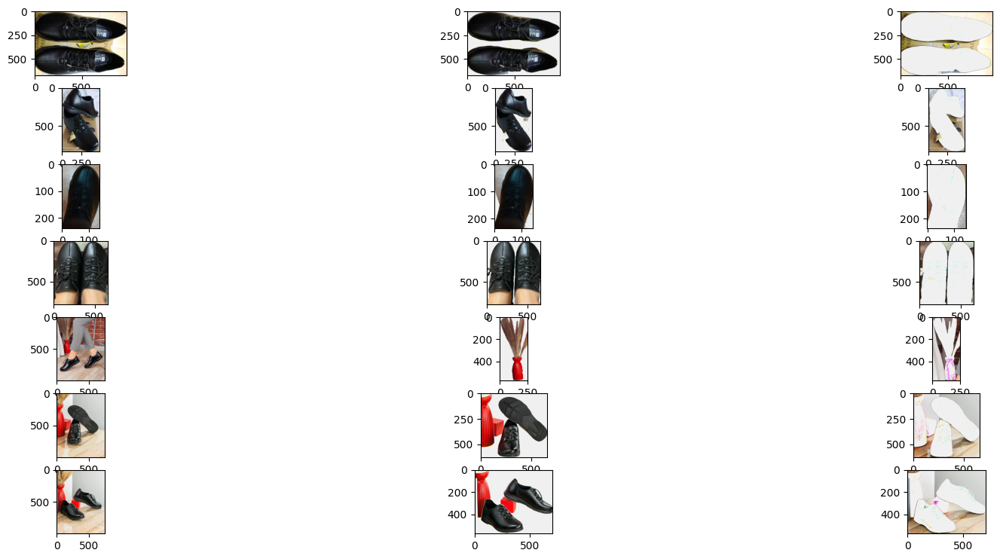

In [53]:
query_imgs, gallery_imgs = get_query_and_gallery_images_for_a_product_id(product_id_for_iteration)

for i in range(len(gallery_imgs)):
  gallery_imgs[i] = '/content/' + gallery_imgs[i]

image_paths = query_imgs + gallery_imgs

rows = len(image_paths)
columns = 3

fig = plt.figure(figsize=(rows * 3, columns * 3))

index = 1
for image_path in image_paths:
  image, masked, inverse_masked, bbox = get_mask_and_inverse_mask(image_path)

  img = F.to_pil_image(image)
  fig.add_subplot(rows, columns, index)
  plt.imshow(np.asarray(img))

  fig.add_subplot(rows, columns, index + 1)
  if masked is not None:
    img = F.crop(F.to_pil_image(masked), bbox[1], bbox[0], bbox[3], bbox[2])
    plt.imshow(np.asarray(img))

  fig.add_subplot(rows, columns, index + 2)
  if inverse_masked is not None:
    img = F.crop(F.to_pil_image(inverse_masked), bbox[1], bbox[0], bbox[3], bbox[2])
    plt.imshow(np.asarray(img))

  index += 3

plt.show()

## Generate Embeddings

In [57]:
vit_model = open_clip.create_model_and_transforms('ViT-H-14', None)[0].visual
vit_model.load_state_dict(torch.load('/content/pretrained/model3.pt'))

<All keys matched successfully>

In [58]:
vit_model = vit_model.to('cuda')

In [59]:
img_transform = T.Compose([T.ToPILImage(),
                           T.Resize(size=(224, 224),
                                    interpolation=T.InterpolationMode.BICUBIC,
                                    antialias=True),
                           T.ToTensor(),
                           T.Normalize(mean=(0.48145466, 0.4578275, 0.40821073),
                                       std=(0.26862954, 0.26130258, 0.27577711))])

In [57]:
class CustomDataset(Dataset):
    def __init__(self, annotations_file, img_dir, indices,
                 transform=None,
                 crop_transform=None,
                 target_transform=None,
                 crop_to_bbox=False,
                 crop_to_bbox_detections=False):
        self.img_labels = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.indices = indices
        self.transform = transform
        self.target_transform = target_transform
        self.crop_to_bbox = crop_to_bbox
        self.crop_to_bbox_detections = crop_to_bbox_detections
        self.crop_transform = crop_transform

    def __len__(self):
        # return len(self.img_labels)
        return 2

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx, self.indices[0]])
        if self.crop_to_bbox:
          x = self.img_labels.iloc[idx, self.indices[2]]
          y = self.img_labels.iloc[idx, self.indices[3]]
          w = self.img_labels.iloc[idx, self.indices[4]]
          h = self.img_labels.iloc[idx, self.indices[5]]
          cropped_img_path = draw_bounding_box_and_save('/content/' + img_path, x, y, w, h)
          image, masked, inverse_masked, bbox = get_mask_and_inverse_mask(cropped_img_path)
        else:
          image, masked, inverse_masked, bbox = get_mask_and_inverse_mask('/content/' + img_path)
        label = self.img_labels.iloc[idx, self.indices[1]]
        if self.transform and not self.crop_to_bbox_detections:
            image = self.transform(image)
            if masked is not None and inverse_masked is not None:
              masked = self.transform(masked)
              inverse_masked = self.transform(inverse_masked)
        elif self.crop_transform and self.crop_to_bbox_detections:
            if masked is not None and inverse_masked is not None and bbox is not None:
              x = bbox[0]
              y = bbox[1]
              w = bbox[2]
              h = bbox[3]
              image = self.crop_transform(image, x, y, w, h)
              masked = self.crop_transform(masked, x, y, w, h)
              inverse_masked = self.crop_transform(inverse_masked, x, y, w, h)
            else:
              if self.transform:
                image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        if masked is None and inverse_masked is None:
          masked = torch.empty(0)
          inverse_masked = torch.empty(0)
        return image, masked, inverse_masked, label, img_path

def image_transformation(image):
    images = img_transform(image)
    #images = img_transform(F.to_pil_image(image))
    return images

def image_transform_with_bbox_crop(image, x, y, w, h):
    images = F.crop(image, y, x, h, w)
    images = img_transform(images)
    return images

In [58]:
gallery = pd.read_csv("/content/original_datasets/gallery.csv")
gallery.head()

,seller_img_id,img_path,product_id
0,0,gallery/ambitious-tough-teal-from-asgard.jpg,5019
1,1,gallery/fine-shrewd-oarfish-of-genius.jpg,5008
2,2,gallery/bold-nickel-gecko-of-reputation.jpg,9
3,3,gallery/marvellous-uber-boobook-of-lightning.jpg,3589
4,4,gallery/bouncy-economic-agama-of-honeydew.jpg,3656


torch.Size([3, 1000, 750])


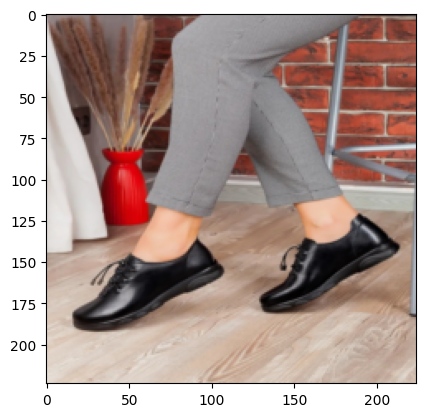

In [59]:
# test image preprocessing
img = read_image('/content/' + gallery.iloc[0, 1])
print(img.shape)
img_ = F.to_pil_image(F.resize(img, (224, 224), antialias=True))
plt.imshow(np.asarray(img_))

torch.Size([3, 224, 224])


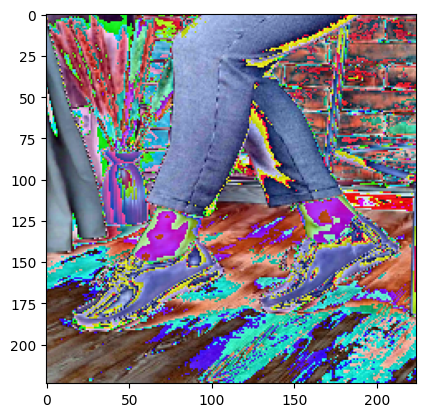

In [60]:
img = read_image('/content/' + gallery.iloc[0, 1])
proc_img = image_transformation(img)
print(proc_img.shape)
proc_img = F.to_pil_image(proc_img)
plt.imshow(np.asarray(proc_img))

### Embeddings of Masked and Inverse Masked Images without Detection Bounding Box Cropping

100%|██████████| 2/2 [00:02<00:00,  1.27s/it]


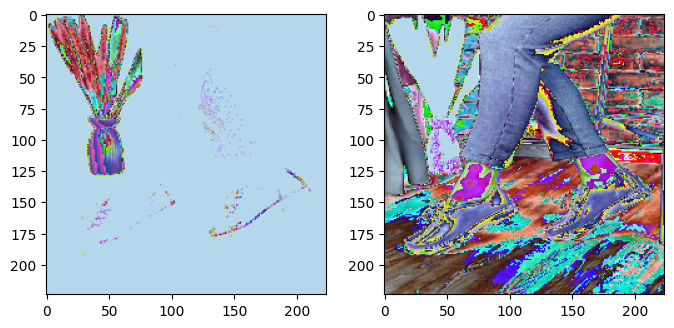

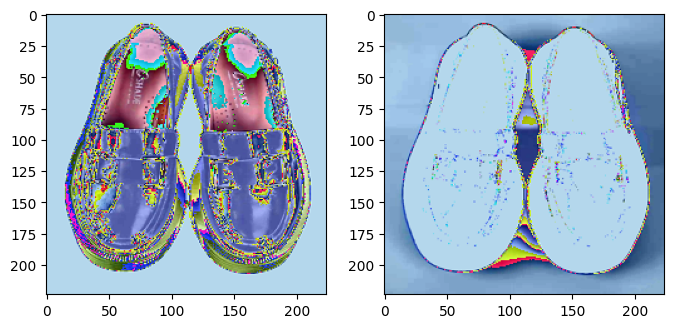

In [61]:
gallery_dataset = CustomDataset("/content/original_datasets/gallery.csv", "", [1, 2], transform=image_transformation)
gallery_dataloader = DataLoader(gallery_dataset, batch_size=1, shuffle=False)

df = pd.DataFrame(columns=['image_tensor_path', 'masked_image_tensor_path', 'inverse_masked_image_tensor_path', 'label', 'image_path', 'masked_similarity', 'inverse_masked_similarity'])

folder_name = f'gallery_tensors_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

graph_index = 1
for idx, data in enumerate(tqdm(gallery_dataloader)):
    image, masked, inverse_masked, label, img_path = data

    fig = plt.figure(figsize=(8, 8))

    proc_img = F.to_pil_image(masked[0])
    plt.subplot(2, 2, graph_index), plt.imshow(proc_img)

    proc_img = F.to_pil_image(inverse_masked[0])
    plt.subplot(2, 2, graph_index + 1), plt.imshow(proc_img)

    graph_index += 2

    image = image.to('cuda')
    if masked.nelement() != 0 and masked.nelement() != 0:
      masked = masked.to('cuda')
      inverse_masked = inverse_masked.to('cuda')

    with torch.no_grad():
        output_image = vit_model(image)
        embeddings_image = output_image.cpu()
        if masked.nelement() != 0 and masked.nelement() != 0:
          output_masked_image = vit_model(masked)
          output_inverse_masked_image = vit_model(inverse_masked)
          embeddings_masked_image = output_masked_image.cpu()
          embeddings_inverse_masked_image = output_inverse_masked_image.cpu()

    file_path_image = f'{folder_name}/image_{idx}_{i}.pt'
    torch.save(embeddings_image[0], '/content/' + file_path_image)
    if masked.nelement() != 0 and masked.nelement() != 0:
      file_path_masked_image = f'{folder_name}/masked_image_{idx}_{i}.pt'
      file_path_inverse_masked_image = f'{folder_name}/inverse_masked_image_{idx}_{i}.pt'
      torch.save(embeddings_masked_image[0], '/content/' + file_path_masked_image)
      torch.save(embeddings_inverse_masked_image[0], '/content/' + file_path_inverse_masked_image)

      euclidean_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_masked_image, p=2)
      euclidean_inverse_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_inverse_masked_image, p=2)

      df.loc[len(df)] = [file_path_image, file_path_masked_image, file_path_inverse_masked_image, label.item(), img_path[0], euclidean_masked.item(), euclidean_inverse_masked.item()]
    else:
      df.loc[len(df)] = [file_path_image, 'None', 'None', label.item(), img_path[0], -1, -1]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/gallery_tensors_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}.csv', index=False)

In [62]:
# !rm -rf '/content/gallery_tensors_bt_0.4_tt_0.25'

In [63]:
query = pd.read_csv("/content/original_datasets/queries.csv")
query.head()

,user_img_id,img_path,bbox_x,bbox_y,bbox_w,bbox_h,product_id
0,0,queries/magnetic-powerful-platypus-of-hail.jpeg,0,212,740,664,5013
1,1,queries/free-keen-mole-of-cookies.jpeg,0,43,714,378,3550
2,2,queries/hilarious-precious-parakeet-of-adverti...,240,310,395,405,71
3,3,queries/optimal-uptight-ringtail-of-cleaning.jpeg,0,242,475,627,3566
4,4,queries/nonchalant-impala-of-fabulous-artistry...,350,125,150,81,5329


In [64]:
query_dataset = CustomDataset("/content/original_datasets/queries.csv", "", [1, 6, 2, 3, 4, 5], transform=image_transformation, crop_to_bbox=True)
query_dataloader = DataLoader(query_dataset, batch_size=1, shuffle=False)

df = pd.DataFrame(columns=['image_tensor_path', 'masked_image_tensor_path', 'inverse_masked_image_tensor_path', 'label', 'image_path', 'masked_similarity', 'inverse_masked_similarity'])

folder_name = f'query_tensors_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

for idx, data in enumerate(tqdm(query_dataloader)):
    image, masked, inverse_masked, label, img_path = data
    image = image.to('cuda')
    if masked.nelement() != 0 and masked.nelement() != 0:
      masked = masked.to('cuda')
      inverse_masked = inverse_masked.to('cuda')

    with torch.no_grad():
        output_image = vit_model(image)
        embeddings_image = output_image.cpu()
        if masked.nelement() != 0 and masked.nelement() != 0:
          output_masked_image = vit_model(masked)
          output_inverse_masked_image = vit_model(inverse_masked)
          embeddings_masked_image = output_masked_image.cpu()
          embeddings_inverse_masked_image = output_inverse_masked_image.cpu()

    file_path_image = f'{folder_name}/image_{idx}_{i}.pt'
    torch.save(embeddings_image[0], '/content/' + file_path_image)
    if masked.nelement() != 0 and masked.nelement() != 0:
      file_path_masked_image = f'{folder_name}/masked_image_{idx}_{i}.pt'
      file_path_inverse_masked_image = f'{folder_name}/inverse_masked_image_{idx}_{i}.pt'
      torch.save(embeddings_masked_image[0], '/content/' + file_path_masked_image)
      torch.save(embeddings_inverse_masked_image[0], '/content/' + file_path_inverse_masked_image)

      euclidean_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_masked_image, p=2)
      euclidean_inverse_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_inverse_masked_image, p=2)

      df.loc[len(df)] = [file_path_image, file_path_masked_image, file_path_inverse_masked_image, label.item(), img_path[0], euclidean_masked.item(), euclidean_inverse_masked.item()]
    else:
      df.loc[len(df)] = [file_path_image, 'None', 'None', label.item(), img_path[0], -1, -1]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/query_tensors_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}.csv', index=False)

100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


In [65]:
# !rm -rf '/content/query_tensors_bt_0.4_tt_0.25'

### Embeddings of Masked and Inverse Maked Images with Detection Bounding Box Cropping

100%|██████████| 2/2 [00:02<00:00,  1.21s/it]


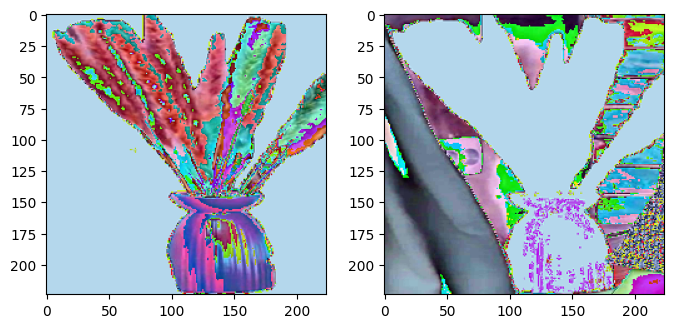

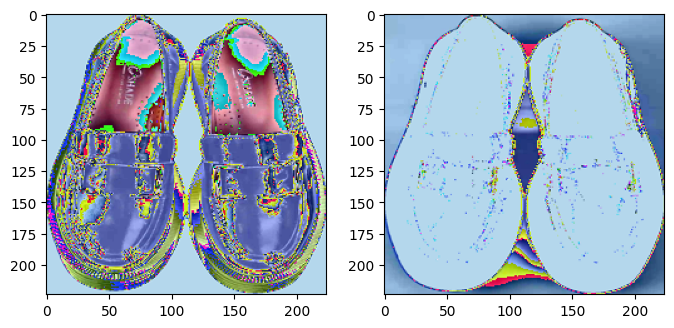

In [66]:
gallery_dataset = CustomDataset("/content/original_datasets/gallery.csv", "", [1, 2], transform=image_transformation, crop_transform=image_transform_with_bbox_crop, crop_to_bbox_detections=True)
gallery_dataloader = DataLoader(gallery_dataset, batch_size=1, shuffle=False)

df = pd.DataFrame(columns=['image_tensor_path', 'masked_image_tensor_path', 'inverse_masked_image_tensor_path', 'label', 'image_path', 'masked_similarity', 'inverse_masked_similarity'])

folder_name = f'gallery_tensors_detection_bbox_crop_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

graph_index = 1
for idx, data in enumerate(tqdm(gallery_dataloader)):
    image, masked, inverse_masked, label, img_path = data

    fig = plt.figure(figsize=(8, 8))

    proc_img = F.to_pil_image(masked[0])
    plt.subplot(2, 2, graph_index), plt.imshow(proc_img)

    proc_img = F.to_pil_image(inverse_masked[0])
    plt.subplot(2, 2, graph_index + 1), plt.imshow(proc_img)

    graph_index += 2

    image = image.to('cuda')

    if masked.nelement() != 0 and masked.nelement() != 0:
      masked = masked.to('cuda')
      inverse_masked = inverse_masked.to('cuda')

    with torch.no_grad():
        output_image = vit_model(image)
        embeddings_image = output_image.cpu()
        if masked.nelement() != 0 and masked.nelement() != 0:
          output_masked_image = vit_model(masked)
          output_inverse_masked_image = vit_model(inverse_masked)
          embeddings_masked_image = output_masked_image.cpu()
          embeddings_inverse_masked_image = output_inverse_masked_image.cpu()

    file_path_image = f'{folder_name}/image_{idx}_{i}.pt'
    torch.save(embeddings_image[0], '/content/' + file_path_image)
    if masked.nelement() != 0 and masked.nelement() != 0:
      file_path_masked_image = f'{folder_name}/masked_image_{idx}_{i}.pt'
      file_path_inverse_masked_image = f'{folder_name}/inverse_masked_image_{idx}_{i}.pt'
      torch.save(embeddings_masked_image[0], '/content/' + file_path_masked_image)
      torch.save(embeddings_inverse_masked_image[0], '/content/' + file_path_inverse_masked_image)

      euclidean_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_masked_image, p=2)
      euclidean_inverse_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_inverse_masked_image, p=2)

      df.loc[len(df)] = [file_path_image, file_path_masked_image, file_path_inverse_masked_image, label.item(), img_path[0], euclidean_masked.item(), euclidean_inverse_masked.item()]
    else:
      df.loc[len(df)] = [file_path_image, 'None', 'None', label.item(), img_path[0], -1, -1]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/gallery_tensors_detection_bbox_crop_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}.csv', index=False)

In [67]:
# !rm -rf '/content/gallery_tensors_detection_bbox_crop_bt_0.4_tt_0.25'

In [68]:
query_dataset = CustomDataset("/content/original_datasets/queries.csv", "", [1, 6, 2, 3, 4, 5], transform=image_transformation, crop_transform=image_transform_with_bbox_crop, crop_to_bbox_detections=True, crop_to_bbox=True)
query_dataloader = DataLoader(query_dataset, batch_size=1, shuffle=False)

df = pd.DataFrame(columns=['image_tensor_path', 'masked_image_tensor_path', 'inverse_masked_image_tensor_path', 'label', 'image_path', 'masked_similarity', 'inverse_masked_similarity'])

folder_name = f'query_tensors_detection_bbox_crop_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

# graph_index = 1
for idx, data in enumerate(tqdm(query_dataloader)):
    image, masked, inverse_masked, label, img_path = data

    # fig = plt.figure(figsize=(8, 8))

    # proc_img = F.to_pil_image(masked[0])
    # plt.subplot(2, 2, graph_index), plt.imshow(proc_img)

    # proc_img = F.to_pil_image(inverse_masked[0])
    # plt.subplot(2, 2, graph_index + 1), plt.imshow(proc_img)

    # graph_index += 2

    image = image.to('cuda')
    if masked.nelement() != 0 and masked.nelement() != 0:
      masked = masked.to('cuda')
      inverse_masked = inverse_masked.to('cuda')

    with torch.no_grad():
        output_image = vit_model(image)
        embeddings_image = output_image.cpu()
        if masked.nelement() != 0 and masked.nelement() != 0:
          output_masked_image = vit_model(masked)
          output_inverse_masked_image = vit_model(inverse_masked)
          embeddings_masked_image = output_masked_image.cpu()
          embeddings_inverse_masked_image = output_inverse_masked_image.cpu()

    file_path_image = f'{folder_name}/image_{idx}_{i}.pt'
    torch.save(embeddings_image[0], '/content/' + file_path_image)
    if masked.nelement() != 0 and masked.nelement() != 0:
      file_path_masked_image = f'{folder_name}/masked_image_{idx}_{i}.pt'
      file_path_inverse_masked_image = f'{folder_name}/inverse_masked_image_{idx}_{i}.pt'
      torch.save(embeddings_masked_image[0], '/content/' + file_path_masked_image)
      torch.save(embeddings_inverse_masked_image[0], '/content/' + file_path_inverse_masked_image)

      euclidean_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_masked_image, p=2)
      euclidean_inverse_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_inverse_masked_image, p=2)

      df.loc[len(df)] = [file_path_image, file_path_masked_image, file_path_inverse_masked_image, label.item(), img_path[0], euclidean_masked.item(), euclidean_inverse_masked.item()]
    else:
      df.loc[len(df)] = [file_path_image, 'None', 'None', label.item(), img_path[0], -1, -1]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/query_tensors_detection_bbox_crop_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}.csv', index=False)

100%|██████████| 2/2 [00:01<00:00,  1.06it/s]


In [ ]:
# !rm -rf '/content/query_tensors_detection_bbox_crop_bt_0.4_tt_0.25'

## Saving Generated Embeddings

In [ ]:
%%capture
!zip -r '/content/gallery_tensors_bt_0.4_tt_0.25.zip' '/content/gallery_tensors_bt_0.4_tt_0.25'

In [ ]:
%%capture
!zip -r '/content/query_tensors_bt_0.4_tt_0.25.zip' '/content/query_tensors_bt_0.4_tt_0.25'

In [ ]:
%%capture
!zip -r '/content/gallery_tensors_detection_bbox_crop_bt_0.4_tt_0.25.zip' '/content/gallery_tensors_detection_bbox_crop_bt_0.4_tt_0.25'

In [ ]:
%%capture
!zip -r '/content/query_tensors_detection_bbox_crop_bt_0.4_tt_0.25.zip' '/content/query_tensors_detection_bbox_crop_bt_0.4_tt_0.25'

In [ ]:
!cp '/content/gallery_tensors_bt_0.4_tt_0.25.zip' '/content/gdrive/MyDrive/gallery_tensors_bt_0.4_tt_0.25.zip'
!cp '/content/query_tensors_bt_0.4_tt_0.25.zip' '/content/gdrive/MyDrive/query_tensors_bt_0.4_tt_0.25.zip'
!cp '/content/gallery_tensors_detection_bbox_crop_bt_0.4_tt_0.25.zip' '/content/gdrive/MyDrive/gallery_tensors_detection_bbox_crop_bt_0.4_tt_0.25.zip'
!cp '/content/query_tensors_detection_bbox_crop_bt_0.4_tt_0.25.zip' '/content/gdrive/MyDrive/query_tensors_detection_bbox_crop_bt_0.4_tt_0.25.zip'

# BLIP-2 Image to Text Generation

In [63]:
!pip install transformers

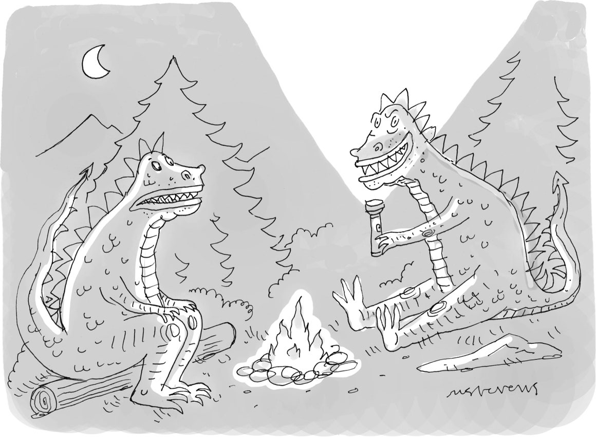

In [64]:
import requests
from PIL import Image

url = 'https://media.newyorker.com/cartoons/63dc6847be24a6a76d90eb99/master/w_1160,c_limit/230213_a26611_838.jpg'
image = Image.open(requests.get(url, stream=True).raw).convert('RGB')
display(image.resize((596, 437)))

In [ ]:
from transformers import AutoProcessor, Blip2ForConditionalGeneration
import torch

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b", torch_dtype=torch.float16)

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

In [ ]:
inputs = processor(image, return_tensors="pt").to(device, torch.float16)

generated_ids = model.generate(**inputs, max_new_tokens=20)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
print(generated_text)

two cartoon monsters sitting around a campfire


In [ ]:
prompt = "this is a cartoon of"

inputs = processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)

generated_ids = model.generate(**inputs, max_new_tokens=20)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
print(generated_text)

two monsters sitting around a campfire


In [ ]:
prompt = "Question: What is a dinosaur holding? Answer:"

inputs = processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)

generated_ids = model.generate(**inputs, max_new_tokens=10)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
print(generated_text)

A torch


## Trying Out for the Gallery Images and Query Images

### Image Captioning

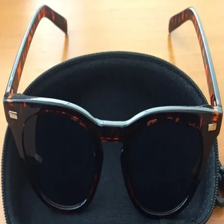

a pair of sunglasses sitting in a black case 



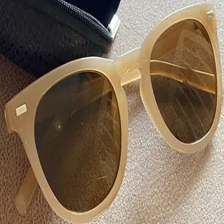

a pair of sunglasses with a black case 



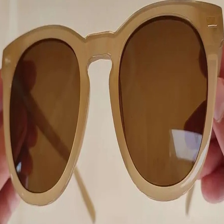

a person holding up a pair of sunglasses 



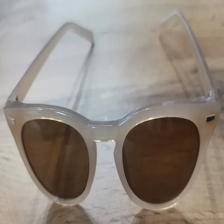

a pair of sunglasses with brown lenses 



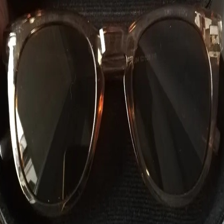

a pair of sunglasses in a black case 



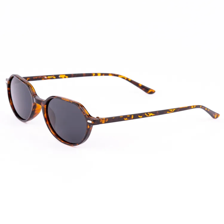

the tortoise sunglasses are made from tortoise shell 



In [ ]:
descriptions = []
product_id = 3550
query_imgs, gallery_imgs = get_query_and_gallery_images_for_a_product_id(product_id)

for image_path in query_imgs:
  image = Image.open(image_path).convert('RGB')

  inputs = processor(image, return_tensors="pt").to(device, torch.float16)

  generated_ids = model.generate(**inputs, max_new_tokens=10)
  generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
  descriptions.append(generated_text)
  display(image.resize((224, 224)))
  print(generated_text, '\n')

for image_path in gallery_imgs:
  image = Image.open('/content/' + image_path).convert('RGB')

  inputs = processor(image, return_tensors="pt").to(device, torch.float16)

  generated_ids = model.generate(**inputs, max_new_tokens=10)
  generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
  descriptions.append(generated_text)
  display(image.resize((224, 224)))
  print(generated_text, '\n')

In [ ]:
descriptions

['a pair of sunglasses sitting in a black case',
 'a pair of sunglasses with a black case',
 'a person holding up a pair of sunglasses',
 'a pair of sunglasses with brown lenses',
 'a pair of sunglasses in a black case',
 'the tortoise sunglasses are made from tortoise shell']

In [ ]:
from collections import Counter

word_lists = []
word_set = set()
for des in descriptions:
  words = des.split()
  word_set = word_set.union(words)
  word_lists.append(words)

words_with_count = {w:0 for w in word_set}
for word in word_set:
  for li in word_lists:
    if word in li:
      words_with_count[word] += 1

print(words_with_count)

{'in': 2, 'with': 2, 'a': 5, 'up': 1, 'lenses': 1, 'pair': 5, 'holding': 1, 'black': 3, 'person': 1, 'are': 1, 'sunglasses': 6, 'brown': 1, 'of': 5, 'from': 1, 'made': 1, 'case': 3, 'sitting': 1, 'tortoise': 1, 'shell': 1, 'the': 1}


### Question and Answer

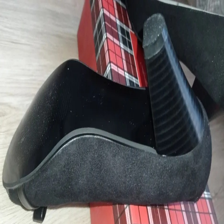

Car audio 



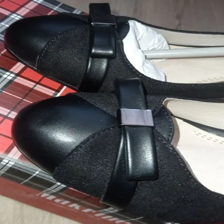

Shoes 



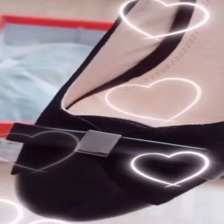

Shoes 



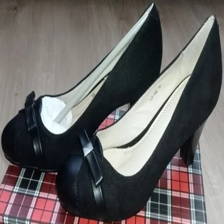

Shoes 



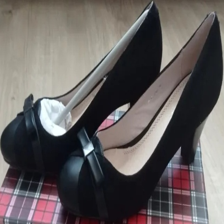

Shoes 



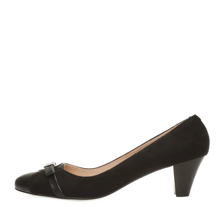

Shoes 



In [ ]:
categories = []
product_id = 5145
query_imgs, gallery_imgs = get_query_and_gallery_images_for_a_product_id(product_id)

prompt = "Question: What is the product category? Answer:"

for image_path in query_imgs:
  image = Image.open(image_path).convert('RGB')

  inputs = processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)

  generated_ids = model.generate(**inputs, max_new_tokens=10)
  generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
  categories.append(generated_text)
  display(image.resize((224, 224)))
  print(generated_text, '\n')

for image_path in gallery_imgs:
  image = Image.open('/content/' + image_path).convert('RGB')

  inputs = processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)

  generated_ids = model.generate(**inputs, max_new_tokens=10)
  generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
  categories.append(generated_text)
  display(image.resize((224, 224)))
  print(generated_text, '\n')

In [ ]:
product_ids = gallery['product_id'].unique().tolist()

prompt = "Question: What is the product category? Answer:"

df = pd.DataFrame(columns=['label', 'gallery/query', 'category', 'count'])

folder_name = 'image_to_text_results'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

for id in tqdm(product_ids):
  query_imgs, gallery_imgs = get_query_and_gallery_images_for_a_product_id(id)

  query_categories = []
  gallery_categories = []

  for image_path in query_imgs:
    image = Image.open(image_path).convert('RGB')

    inputs = processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)

    generated_ids = model.generate(**inputs, max_new_tokens=10)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
    query_categories.append(generated_text.lower().strip())

  for image_path in gallery_imgs:
    image = Image.open('/content/' + image_path).convert('RGB')

    inputs = processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)

    generated_ids = model.generate(**inputs, max_new_tokens=10)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
    gallery_categories.append(generated_text.lower().strip())

  query_categories_set = set(query_categories)
  gallery_categories_set = set(gallery_categories)

  for category in query_categories_set:
    df.loc[len(df)] = [id, 'query', category, query_categories.count(category)]

  for category in gallery_categories_set:
    df.loc[len(df)] = [id, 'gallery', category, gallery_categories.count(category)]

  all = query_categories + gallery_categories
  all_set = set(all)
  for category in all_set:
    df.loc[len(df)] = [id, 'all', category, all.count(category)]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/prompt_What-is-the-product-category.csv', index=False)

100%|██████████| 609/609 [08:54<00:00,  1.14it/s]


In [ ]:
df = pd.read_csv(f'/content/{folder_name}/prompt_What-is-the-product-category.csv', low_memory=False)
df.head()

,index,label,gallery/query,category,count
0,0,5019,query,shoes,4
1,1,5019,gallery,shoes,3
2,2,5019,all,shoes,7
3,3,5008,query,shoes,5
4,4,5008,gallery,loafers,2


In [ ]:
!cp '/content/image_to_text_results/prompt_What-is-the-product-category.csv' '/content/gdrive/MyDrive/'

#### Saving the Categories of Gallery Images

In [ ]:
df1 = df.loc[df['gallery/query'] == 'gallery']
df1.drop(['index'], axis=1, inplace=True)
df1.reset_index(drop=True, inplace = True)
display(df1.head())

product_ids = gallery['product_id'].unique().tolist()

df2 = df = pd.DataFrame(columns=['label', 'category', 'count'])

for id in product_ids:
  temp_df = df1.loc[df1['label'] == id]
  results = {}
  for index, row in temp_df.iterrows():
    results[row['category']] = row['count']

  max_key = ''
  max_value = 0
  for key, value in results.items():
    if value > max_value:
      max_value = value
      max_key = key

  df2.loc[len(df2)] = [id, max_key, max_value]

df2.reset_index(inplace = True)
df2 = df2.astype({'label': int, 'count': int})
df2.to_csv(f'/content/{folder_name}/prompt_What-is-the-product-category_gallery_version.csv', index=False)
display(df2.head())

,label,gallery/query,category,count
0,5019,gallery,shoes,3
1,5008,gallery,loafers,2
2,5008,gallery,shoes,3
3,9,gallery,sports & recreation,1
4,9,gallery,basketball,1


,index,label,category,count
0,0,5019,shoes,3
1,1,5008,shoes,3
2,2,9,sports & recreation,1
3,3,3589,sunglasses,1
4,4,3656,sunglasses,2


In [ ]:
!cp '/content/image_to_text_results/prompt_What-is-the-product-category_gallery_version.csv' '/content/gdrive/MyDrive/'

In [66]:
df1 = df.loc[df['gallery/query'] == 'all']
df1.drop(['index'], axis=1, inplace=True)
df1.reset_index(drop=True, inplace = True)
display(df1.head())

product_ids = gallery['product_id'].unique().tolist()

df2 = df = pd.DataFrame(columns=['label', 'category', 'count'])

for id in product_ids:
  temp_df = df1.loc[df1['label'] == id]
  results = {}
  for index, row in temp_df.iterrows():
    results[row['category']] = row['count']

  max_key = ''
  max_value = 0
  for key, value in results.items():
    if value > max_value:
      max_value = value
      max_key = key

  df2.loc[len(df2)] = [id, max_key, max_value]

df2.reset_index(inplace = True)
df2 = df2.astype({'label': int, 'count': int})
df2.to_csv(f'/content/{folder_name}/prompt_What-is-the-product-category_all_version.csv', index=False)
display(df2.head())

In [ ]:
!cp '/content/image_to_text_results/prompt_What-is-the-product-category_all_version.csv' '/content/gdrive/MyDrive/'

## Generating Embeddings

In [53]:
!mkdir '/content/image_to_text_results/'
!cp '/content/gdrive/MyDrive/prompt_What-is-the-product-category_all_version.csv' '/content/image_to_text_results/'
!cp '/content/gdrive/MyDrive/prompt_What-is-the-product-category_gallery_version.csv' '/content/image_to_text_results/'
!cp '/content/gdrive/MyDrive/prompt_What-is-the-product-category.csv' '/content/image_to_text_results/'

In [54]:
CLASSES = ['products']
BOX_TRESHOLD = 0.4
TEXT_TRESHOLD = 0.25

def detect_masks(img_path, category):
    if category is not None:
      CLASSES = [category]
    else:
      CLASSES = ['products']
    image = cv2.imread(img_path)
    detections = grounding_dino_model.predict_with_classes(
        image=image,
        classes=enhance_class_name(class_names=CLASSES),
        box_threshold=BOX_TRESHOLD,
        text_threshold=TEXT_TRESHOLD
    )
    detections = detections[detections.class_id != None]
    detections.mask = segment(
        sam_predictor=sam_predictor,
        image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
        xyxy=detections.xyxy
    )
    return detections.mask, detections.xyxy

def get_mask_and_inverse_mask(img_path, category):
  masks, bboxes = detect_masks(img_path, category)
  image = read_image(img_path)

  if len(masks) >= 1:
    masks_np_arr = {}

    for i in range(len(masks)):
      mask = masks[i:i+1, :]
      mask = mask.astype(int)
      mask = np.repeat(mask, 3, axis = 0)
      # mask = np.where(mask==0, 0, 1)
      # mask = mask.astype('uint8')
      masks_np_arr[i] = mask

    final_mask = None
    if len(masks_np_arr) > 1:
      for key, mask in masks_np_arr.items():
        if final_mask is None:
          final_mask = mask
        else:
          final_mask = np.add(final_mask, mask)
      final_mask = np.where(final_mask > 0, 1, 0)
      final_inverse_mask = np.where(final_mask==0, 1, 0)
      # final_mask = final_mask.astype('uint8')
      # final_inverse_mask = final_inverse_mask.astype('uint8')
    else:
      final_mask = masks_np_arr[0]
      final_inverse_mask = np.where(final_mask==0, 1, 0)
      # final_inverse_mask = final_inverse_mask.astype('uint8')

    image_ = image.numpy()

    # final_mask = final_mask.astype('int64')
    final_mask = np.where(final_mask == 0, -1, 1)
    masked = np.multiply(image_, final_mask)
    masked = np.where(masked < 0, 240, masked)
    masked = masked.astype('uint8')

    # final_inverse_mask = final_inverse_mask.astype('int64')
    final_inverse_mask = np.where(final_inverse_mask == 0, -1, 1)
    inverse_masked = np.multiply(image_, final_inverse_mask)
    inverse_masked = np.where(inverse_masked < 0, 240, inverse_masked)
    inverse_masked = inverse_masked.astype('uint8')

    masked = torch.tensor(masked)
    inverse_masked = torch.tensor(inverse_masked)

    # calculate bounding box parameters for cropping
    x = []
    y = []
    for bbox in bboxes:
      x.append(bbox[0])
      x.append(bbox[2])
      y.append(bbox[1])
      y.append(bbox[3])
    min_x = math.floor(min(x))
    min_y = math.floor(min(y))
    max_x = math.ceil(max(x))
    max_y = math.ceil(max(y))

    return image, masked, inverse_masked, (min_x, min_y, max_x - min_x, max_y - min_y)
  else:
    return image, None, None, None

In [55]:
class CustomDataset(Dataset):
    def __init__(self, annotations_file, category_annotations_file, img_dir, indices,
                 transform=None,
                 crop_transform=None,
                 target_transform=None,
                 crop_to_bbox=False,
                 crop_to_bbox_detections=False):
        self.img_labels = pd.read_csv(annotations_file)
        self.img_categories = pd.read_csv(category_annotations_file)
        self.img_dir = img_dir
        self.indices = indices
        self.transform = transform
        self.target_transform = target_transform
        self.crop_to_bbox = crop_to_bbox
        self.crop_to_bbox_detections = crop_to_bbox_detections
        self.crop_transform = crop_transform

    def __len__(self):
        # return len(self.img_labels)
        return 2

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx, self.indices[0]])
        label = self.img_labels.iloc[idx, self.indices[1]]
        category = self.img_categories.loc[self.img_categories.label == label, 'category'].values[0]
        if pd.isna(category):
          category = None
        if self.crop_to_bbox:
          x = self.img_labels.iloc[idx, self.indices[2]]
          y = self.img_labels.iloc[idx, self.indices[3]]
          w = self.img_labels.iloc[idx, self.indices[4]]
          h = self.img_labels.iloc[idx, self.indices[5]]
          cropped_img_path = draw_bounding_box_and_save('/content/' + img_path, x, y, w, h)
          image, masked, inverse_masked, bbox = get_mask_and_inverse_mask(cropped_img_path, category)
        else:
          image, masked, inverse_masked, bbox = get_mask_and_inverse_mask('/content/' + img_path, category)
        if self.transform and not self.crop_to_bbox_detections:
            image = self.transform(image)
            if masked is not None and inverse_masked is not None:
              masked = self.transform(masked)
              inverse_masked = self.transform(inverse_masked)
        elif self.crop_transform and self.crop_to_bbox_detections:
            if masked is not None and inverse_masked is not None and bbox is not None:
              x = bbox[0]
              y = bbox[1]
              w = bbox[2]
              h = bbox[3]
              image = self.crop_transform(image, x, y, w, h)
              masked = self.crop_transform(masked, x, y, w, h)
              inverse_masked = self.crop_transform(inverse_masked, x, y, w, h)
            else:
              if self.transform:
                image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        if masked is None and inverse_masked is None:
          masked = torch.empty(0)
          inverse_masked = torch.empty(0)
        return image, masked, inverse_masked, label, img_path

def image_transformation(image):
    images = img_transform(image)
    #images = img_transform(F.to_pil_image(image))
    return images

def image_transform_with_bbox_crop(image, x, y, w, h):
    images = F.crop(image, y, x, h, w)
    images = img_transform(images)
    return images

### Embeddings of Masked and Inverse Masked Images without Detection Bounding Box Cropping

100%|██████████| 2/2 [00:02<00:00,  1.28s/it]


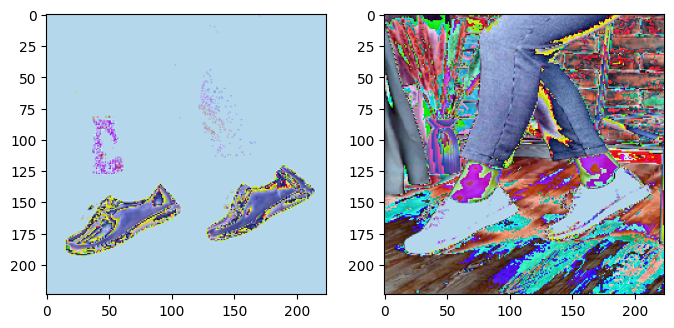

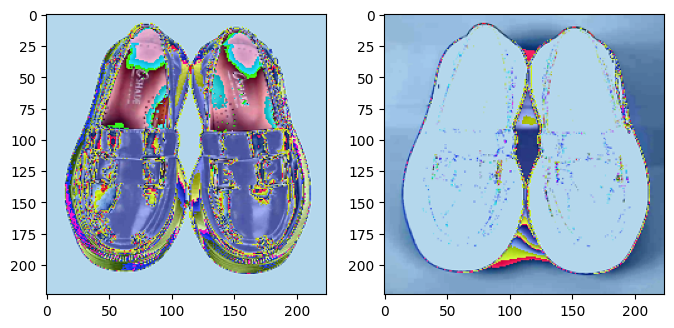

In [60]:
gallery_dataset = CustomDataset("/content/original_datasets/gallery.csv", "/content/image_to_text_results/prompt_What-is-the-product-category_all_version.csv", "", [1, 2], transform=image_transformation)
gallery_dataloader = DataLoader(gallery_dataset, batch_size=1, shuffle=False)

df = pd.DataFrame(columns=['image_tensor_path', 'masked_image_tensor_path', 'inverse_masked_image_tensor_path', 'label', 'image_path', 'masked_similarity', 'inverse_masked_similarity'])

folder_name = f'gallery_tensors_blip_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

graph_index = 1
for idx, data in enumerate(tqdm(gallery_dataloader)):
    image, masked, inverse_masked, label, img_path = data

    fig = plt.figure(figsize=(8, 8))

    proc_img = F.to_pil_image(masked[0])
    plt.subplot(2, 2, graph_index), plt.imshow(proc_img)

    proc_img = F.to_pil_image(inverse_masked[0])
    plt.subplot(2, 2, graph_index + 1), plt.imshow(proc_img)

    graph_index += 2

    image = image.to('cuda')
    if masked.nelement() != 0 and masked.nelement() != 0:
      masked = masked.to('cuda')
      inverse_masked = inverse_masked.to('cuda')

    with torch.no_grad():
        output_image = vit_model(image)
        embeddings_image = output_image.cpu()
        if masked.nelement() != 0 and masked.nelement() != 0:
          output_masked_image = vit_model(masked)
          output_inverse_masked_image = vit_model(inverse_masked)
          embeddings_masked_image = output_masked_image.cpu()
          embeddings_inverse_masked_image = output_inverse_masked_image.cpu()

    file_path_image = f'{folder_name}/image_{idx}_{i}.pt'
    torch.save(embeddings_image[0], '/content/' + file_path_image)
    if masked.nelement() != 0 and masked.nelement() != 0:
      file_path_masked_image = f'{folder_name}/masked_image_{idx}_{i}.pt'
      file_path_inverse_masked_image = f'{folder_name}/inverse_masked_image_{idx}_{i}.pt'
      torch.save(embeddings_masked_image[0], '/content/' + file_path_masked_image)
      torch.save(embeddings_inverse_masked_image[0], '/content/' + file_path_inverse_masked_image)

      euclidean_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_masked_image, p=2)
      euclidean_inverse_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_inverse_masked_image, p=2)

      df.loc[len(df)] = [file_path_image, file_path_masked_image, file_path_inverse_masked_image, label.item(), img_path[0], euclidean_masked.item(), euclidean_inverse_masked.item()]
    else:
      df.loc[len(df)] = [file_path_image, 'None', 'None', label.item(), img_path[0], -1, -1]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/gallery_tensors_blip_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}.csv', index=False)

In [63]:
# !rm -rf '/content/gallery_tensors_blip_bt_0.4_tt_0.25'

In [61]:
query = pd.read_csv("/content/original_datasets/queries.csv")
query.head()

,user_img_id,img_path,bbox_x,bbox_y,bbox_w,bbox_h,product_id
0,0,queries/magnetic-powerful-platypus-of-hail.jpeg,0,212,740,664,5013
1,1,queries/free-keen-mole-of-cookies.jpeg,0,43,714,378,3550
2,2,queries/hilarious-precious-parakeet-of-adverti...,240,310,395,405,71
3,3,queries/optimal-uptight-ringtail-of-cleaning.jpeg,0,242,475,627,3566
4,4,queries/nonchalant-impala-of-fabulous-artistry...,350,125,150,81,5329


100%|██████████| 2/2 [00:03<00:00,  1.76s/it]


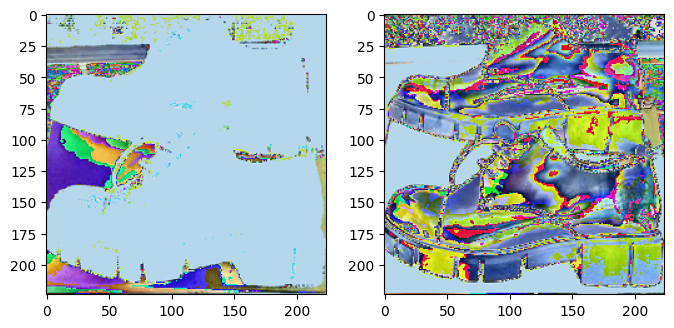

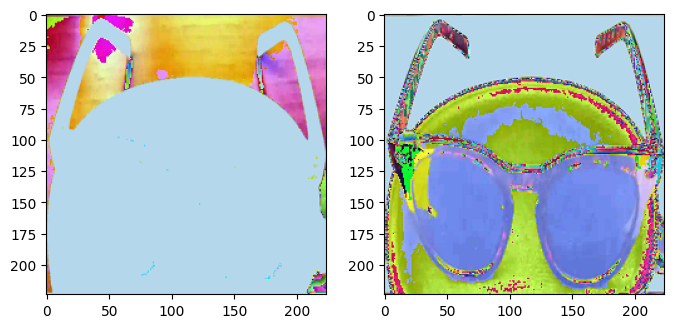

In [62]:
query_dataset = CustomDataset("/content/original_datasets/queries.csv", "/content/image_to_text_results/prompt_What-is-the-product-category_all_version.csv", "", [1, 6, 2, 3, 4, 5], transform=image_transformation, crop_to_bbox=True)
query_dataloader = DataLoader(query_dataset, batch_size=1, shuffle=False)

df = pd.DataFrame(columns=['image_tensor_path', 'masked_image_tensor_path', 'inverse_masked_image_tensor_path', 'label', 'image_path', 'masked_similarity', 'inverse_masked_similarity'])

folder_name = f'query_tensors_blip_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

graph_index = 1
for idx, data in enumerate(tqdm(query_dataloader)):
    image, masked, inverse_masked, label, img_path = data

    fig = plt.figure(figsize=(8, 8))

    proc_img = F.to_pil_image(masked[0])
    plt.subplot(2, 2, graph_index), plt.imshow(proc_img)

    proc_img = F.to_pil_image(inverse_masked[0])
    plt.subplot(2, 2, graph_index + 1), plt.imshow(proc_img)

    graph_index += 2

    image = image.to('cuda')
    if masked.nelement() != 0 and masked.nelement() != 0:
      masked = masked.to('cuda')
      inverse_masked = inverse_masked.to('cuda')

    with torch.no_grad():
        output_image = vit_model(image)
        embeddings_image = output_image.cpu()
        if masked.nelement() != 0 and masked.nelement() != 0:
          output_masked_image = vit_model(masked)
          output_inverse_masked_image = vit_model(inverse_masked)
          embeddings_masked_image = output_masked_image.cpu()
          embeddings_inverse_masked_image = output_inverse_masked_image.cpu()

    file_path_image = f'{folder_name}/image_{idx}_{i}.pt'
    torch.save(embeddings_image[0], '/content/' + file_path_image)
    if masked.nelement() != 0 and masked.nelement() != 0:
      file_path_masked_image = f'{folder_name}/masked_image_{idx}_{i}.pt'
      file_path_inverse_masked_image = f'{folder_name}/inverse_masked_image_{idx}_{i}.pt'
      torch.save(embeddings_masked_image[0], '/content/' + file_path_masked_image)
      torch.save(embeddings_inverse_masked_image[0], '/content/' + file_path_inverse_masked_image)

      euclidean_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_masked_image, p=2)
      euclidean_inverse_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_inverse_masked_image, p=2)

      df.loc[len(df)] = [file_path_image, file_path_masked_image, file_path_inverse_masked_image, label.item(), img_path[0], euclidean_masked.item(), euclidean_inverse_masked.item()]
    else:
      df.loc[len(df)] = [file_path_image, 'None', 'None', label.item(), img_path[0], -1, -1]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/query_tensors_blip_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}.csv', index=False)

### Embeddings of Masked and Inverse Masked Images with Detection Bounding Box Cropping

100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


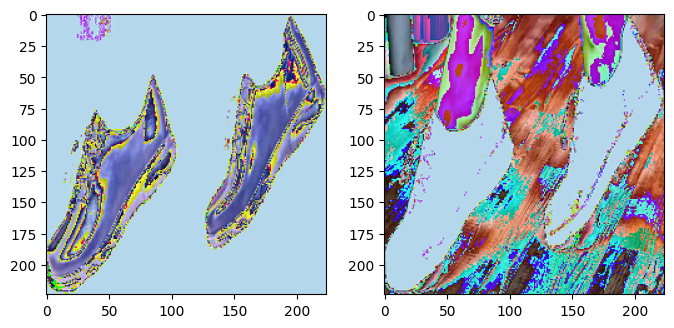

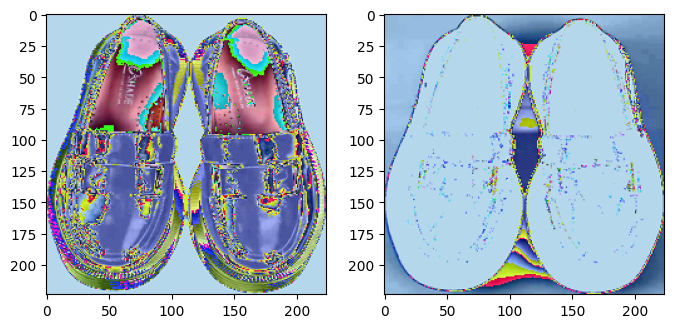

In [64]:
gallery_dataset = CustomDataset("/content/original_datasets/gallery.csv", "/content/image_to_text_results/prompt_What-is-the-product-category_all_version.csv", "", [1, 2], transform=image_transformation, crop_transform=image_transform_with_bbox_crop, crop_to_bbox_detections=True)
gallery_dataloader = DataLoader(gallery_dataset, batch_size=1, shuffle=False)

df = pd.DataFrame(columns=['image_tensor_path', 'masked_image_tensor_path', 'inverse_masked_image_tensor_path', 'label', 'image_path', 'masked_similarity', 'inverse_masked_similarity'])

folder_name = f'gallery_tensors_blip_detection_bbox_crop_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

graph_index = 1
for idx, data in enumerate(tqdm(gallery_dataloader)):
    image, masked, inverse_masked, label, img_path = data

    fig = plt.figure(figsize=(8, 8))

    proc_img = F.to_pil_image(masked[0])
    plt.subplot(2, 2, graph_index), plt.imshow(proc_img)

    proc_img = F.to_pil_image(inverse_masked[0])
    plt.subplot(2, 2, graph_index + 1), plt.imshow(proc_img)

    graph_index += 2

    image = image.to('cuda')

    if masked.nelement() != 0 and masked.nelement() != 0:
      masked = masked.to('cuda')
      inverse_masked = inverse_masked.to('cuda')

    with torch.no_grad():
        output_image = vit_model(image)
        embeddings_image = output_image.cpu()
        if masked.nelement() != 0 and masked.nelement() != 0:
          output_masked_image = vit_model(masked)
          output_inverse_masked_image = vit_model(inverse_masked)
          embeddings_masked_image = output_masked_image.cpu()
          embeddings_inverse_masked_image = output_inverse_masked_image.cpu()

    file_path_image = f'{folder_name}/image_{idx}_{i}.pt'
    torch.save(embeddings_image[0], '/content/' + file_path_image)
    if masked.nelement() != 0 and masked.nelement() != 0:
      file_path_masked_image = f'{folder_name}/masked_image_{idx}_{i}.pt'
      file_path_inverse_masked_image = f'{folder_name}/inverse_masked_image_{idx}_{i}.pt'
      torch.save(embeddings_masked_image[0], '/content/' + file_path_masked_image)
      torch.save(embeddings_inverse_masked_image[0], '/content/' + file_path_inverse_masked_image)

      euclidean_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_masked_image, p=2)
      euclidean_inverse_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_inverse_masked_image, p=2)

      df.loc[len(df)] = [file_path_image, file_path_masked_image, file_path_inverse_masked_image, label.item(), img_path[0], euclidean_masked.item(), euclidean_inverse_masked.item()]
    else:
      df.loc[len(df)] = [file_path_image, 'None', 'None', label.item(), img_path[0], -1, -1]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/gallery_tensors_blip_detection_bbox_crop_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}.csv', index=False)

In [65]:
query_dataset = CustomDataset("/content/original_datasets/queries.csv", "/content/image_to_text_results/prompt_What-is-the-product-category_all_version.csv", "", [1, 6, 2, 3, 4, 5], transform=image_transformation, crop_transform=image_transform_with_bbox_crop, crop_to_bbox_detections=True, crop_to_bbox=True)
query_dataloader = DataLoader(query_dataset, batch_size=1, shuffle=False)

df = pd.DataFrame(columns=['image_tensor_path', 'masked_image_tensor_path', 'inverse_masked_image_tensor_path', 'label', 'image_path', 'masked_similarity', 'inverse_masked_similarity'])

folder_name = f'query_tensors_blip_detection_bbox_crop_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}'
if not os.path.exists('/content/' + folder_name):
    os.makedirs('/content/' + folder_name)

graph_index = 1
for idx, data in enumerate(tqdm(query_dataloader)):
    image, masked, inverse_masked, label, img_path = data

    fig = plt.figure(figsize=(8, 8))

    proc_img = F.to_pil_image(masked[0])
    plt.subplot(2, 2, graph_index), plt.imshow(proc_img)

    proc_img = F.to_pil_image(inverse_masked[0])
    plt.subplot(2, 2, graph_index + 1), plt.imshow(proc_img)

    graph_index += 2

    image = image.to('cuda')
    if masked.nelement() != 0 and masked.nelement() != 0:
      masked = masked.to('cuda')
      inverse_masked = inverse_masked.to('cuda')

    with torch.no_grad():
        output_image = vit_model(image)
        embeddings_image = output_image.cpu()
        if masked.nelement() != 0 and masked.nelement() != 0:
          output_masked_image = vit_model(masked)
          output_inverse_masked_image = vit_model(inverse_masked)
          embeddings_masked_image = output_masked_image.cpu()
          embeddings_inverse_masked_image = output_inverse_masked_image.cpu()

    file_path_image = f'{folder_name}/image_{idx}_{i}.pt'
    torch.save(embeddings_image[0], '/content/' + file_path_image)
    if masked.nelement() != 0 and masked.nelement() != 0:
      file_path_masked_image = f'{folder_name}/masked_image_{idx}_{i}.pt'
      file_path_inverse_masked_image = f'{folder_name}/inverse_masked_image_{idx}_{i}.pt'
      torch.save(embeddings_masked_image[0], '/content/' + file_path_masked_image)
      torch.save(embeddings_inverse_masked_image[0], '/content/' + file_path_inverse_masked_image)

      euclidean_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_masked_image, p=2)
      euclidean_inverse_masked = torch.nn.functional.pairwise_distance(embeddings_image, embeddings_inverse_masked_image, p=2)

      df.loc[len(df)] = [file_path_image, file_path_masked_image, file_path_inverse_masked_image, label.item(), img_path[0], euclidean_masked.item(), euclidean_inverse_masked.item()]
    else:
      df.loc[len(df)] = [file_path_image, 'None', 'None', label.item(), img_path[0], -1, -1]

df.reset_index(inplace = True)
df.to_csv(f'/content/{folder_name}/query_tensors_blip_detection_bbox_crop_bt_{BOX_TRESHOLD}_tt_{TEXT_TRESHOLD}.csv', index=False)

100%|██████████| 2/2 [00:01<00:00,  1.01it/s]


## Saving Generated Embeddings

In [ ]:
%%capture
!zip -r '/content/gallery_tensors_blip_bt_0.4_tt_0.25.zip' '/content/gallery_tensors_blip_bt_0.4_tt_0.25/'

In [ ]:
%%capture
!zip -r '/content/query_tensors_blip_bt_0.4_tt_0.25.zip' '/content/query_tensors_blip_bt_0.4_tt_0.25/'

In [ ]:
%%capture
!zip -r '/content/gallery_tensors_blip_detection_bbox_crop_bt_0.4_tt_0.25.zip' '/content/gallery_tensors_blip_detection_bbox_crop_bt_0.4_tt_0.25/'

In [ ]:
%%capture
!zip -r '/content/query_tensors_blip_detection_bbox_crop_bt_0.4_tt_0.25.zip' '/content/query_tensors_blip_detection_bbox_crop_bt_0.4_tt_0.25/'

In [ ]:
!cp '/content/gallery_tensors_blip_bt_0.4_tt_0.25.zip' '/content/gdrive/MyDrive/gallery_tensors_blip_bt_0.4_tt_0.25.zip'
!cp '/content/query_tensors_blip_bt_0.4_tt_0.25.zip' '/content/gdrive/MyDrive/query_tensors_blip_bt_0.4_tt_0.25.zip'
!cp '/content/gallery_tensors_blip_detection_bbox_crop_bt_0.4_tt_0.25.zip' '/content/gdrive/MyDrive/gallery_tensors_blip_detection_bbox_crop_bt_0.4_tt_0.25.zip'
!cp '/content/query_tensors_blip_detection_bbox_crop_bt_0.4_tt_0.25.zip' '/content/gdrive/MyDrive/query_tensors_blip_detection_bbox_crop_bt_0.4_tt_0.25.zip'